# EDA Notebook

**Goal**: The aim of this notebook is to generate business insights.

**Output**: Charts and insights for presentation.

**Table of Content**
- [1 Library](#1-Library)
- [2 Load Data](#2-Load-Data)
- [3 Join with Zipcode Geometry](#3-Join-with-Zipcode-Geometry)
- [4 Insights Generation](#4-Insights-Generation)
    - [4.1 Trend Analysis](#4.1-Trend-Analysis)
    - [4.2 Geographical Analysis](#4.2-Geographical-Analysis)
    - [4.3 Comparative Market Analysis](#4.3-Comparative-Market-Analysis)
- [5 Conclusion](#5-Conclusion)

**Research Questions**
- Trend Analysis:
    - How have property prices changed over time in NYC?
    - What are the trends in the volume of property sales over the years, and are there any seasonal patterns?
    - Which boroughs have shown the most significant increase in property values, indicating potential for investment?

- Geographical Analysis:
    - What are the high and low-value areas in terms of property sale prices and prices per square feet across different zip codes?


- Comparative Market Analysis
    - How do property prices compare between different building classes (e.g., one-family dwellings vs. two-family dwellings)?

<span style="color:red"> <strong>Warning: </strong> </span>  This notebook contains some visualizations using Folium that are not visible in github.

___
# 1 Library

In [1]:
import numpy as np
import scipy.stats as scs
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import matplotlib.pyplot as plt
import seaborn as sns
import folium
import contextily as cx
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings
warnings.filterwarnings('ignore')

# 2 Load Data

<span style="color:blue"> <strong>Must Read!</strong> </span>

The metadata can be seen in [this link](https://docs.google.com/spreadsheets/d/1NHvIAH6mABrFXmAoesHrzvaRmt5a5I7zCIHHoVLQOSA/edit?usp=sharing).

In [2]:
# Load the data
dataset = pd.read_csv('dataset/split/dataset_train.csv', index_col=0)

# Ensure that longitude and latitude are the correct data type (float)
dataset['longitude'] = dataset['longitude'].astype(float)
dataset['latitude'] = dataset['latitude'].astype(float)

# Create Point geometries
geometry = [Point(xy) for xy in zip(dataset['longitude'], dataset['latitude'])]

# Create a GeoDataFrame
propertySalesPoint = gpd.GeoDataFrame(dataset, geometry=geometry)

# Now 'gdf' is a GeoDataFrame with Point geometries
propertySalesPoint.head()

,address,zip_code,borough_name,borough,block,lot,building_class_category,category_id,building_class_name,gross_square_feet,...,subway_count_in_1km,bus_count_in_1km,schools_count_in_1km,health_facil_count_in_1km,park_properties_count_in_1km,park_zones_count_in_1km,latitude,longitude,geometry,sale_price
128157,34 GRANT AVENUE,11208,BK,3,4111,66,02 TWO FAMILY DWELLINGS,2,TWO FAMILY DWELLINGS,2088.0,...,9.0,11.0,8.0,2.0,5.0,5.0,40.690112,-73.869123,POINT (-73.86912 40.69011),925000.0
158906,131-68 233RD STREET,11422,QN,4,12943,159,01 ONE FAMILY DWELLINGS,1,ONE FAMILY DWELLINGS,1272.0,...,0.0,4.0,5.0,4.0,3.0,0.0,40.676770,-73.736272,POINT (-73.73627 40.67677),630000.0
144731,2025 EAST 74TH STREET,11234,BK,3,8415,30,02 TWO FAMILY DWELLINGS,2,TWO FAMILY DWELLINGS,1998.0,...,0.0,4.0,6.0,1.0,7.0,5.0,40.622509,-73.906276,POINT (-73.90628 40.62251),1040000.0
40959,39 GRAHAM AVENUE,11206,BK,3,3113,20,22 STORE BUILDINGS,22,STORE BUILDINGS,3875.0,...,23.0,37.0,27.0,20.0,30.0,0.0,40.702705,-73.942760,POINT (-73.94276 40.70270),2025000.0
89241,115-42 126TH STREET,11420,QN,4,11669,26,03 THREE FAMILY DWELLINGS,3,THREE FAMILY DWELLINGS,2016.0,...,0.0,7.0,5.0,1.0,7.0,0.0,40.677535,-73.813173,POINT (-73.81317 40.67754),555000.0


In [3]:
# Load spatial data: Zip Code
zipcode = gpd.read_file('dataset/raw/Zip Code/ZIP_CODE_040114.shp')
zipcode = zipcode.to_crs({'init': 'epsg:4326'})

Cannot find header.dxf (GDAL_DATA is not defined)


In [4]:
# Select 'housing' unit only
housing_unit_category = [1, 2, 3, 7, 8, 14]
propertySalesPoint = propertySalesPoint[propertySalesPoint['category_id'].isin(housing_unit_category)]
propertySalesPoint

,address,zip_code,borough_name,borough,block,lot,building_class_category,category_id,building_class_name,gross_square_feet,...,subway_count_in_1km,bus_count_in_1km,schools_count_in_1km,health_facil_count_in_1km,park_properties_count_in_1km,park_zones_count_in_1km,latitude,longitude,geometry,sale_price
128157,34 GRANT AVENUE,11208,BK,3,4111,66,02 TWO FAMILY DWELLINGS,2,TWO FAMILY DWELLINGS,2088.0,...,9.0,11.0,8.0,2.0,5.0,5.0,40.690112,-73.869123,POINT (-73.86912 40.69011),925000.0
158906,131-68 233RD STREET,11422,QN,4,12943,159,01 ONE FAMILY DWELLINGS,1,ONE FAMILY DWELLINGS,1272.0,...,0.0,4.0,5.0,4.0,3.0,0.0,40.676770,-73.736272,POINT (-73.73627 40.67677),630000.0
144731,2025 EAST 74TH STREET,11234,BK,3,8415,30,02 TWO FAMILY DWELLINGS,2,TWO FAMILY DWELLINGS,1998.0,...,0.0,4.0,6.0,1.0,7.0,5.0,40.622509,-73.906276,POINT (-73.90628 40.62251),1040000.0
89241,115-42 126TH STREET,11420,QN,4,11669,26,03 THREE FAMILY DWELLINGS,3,THREE FAMILY DWELLINGS,2016.0,...,0.0,7.0,5.0,1.0,7.0,0.0,40.677535,-73.813173,POINT (-73.81317 40.67754),555000.0
48772,90-12 SUTTER AVE,11417,QN,4,11353,6,02 TWO FAMILY DWELLINGS,2,TWO FAMILY DWELLINGS,2337.0,...,10.0,12.0,18.0,6.0,14.0,1.0,40.676245,-73.846405,POINT (-73.84641 40.67624),120000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6525,606 HENRY STREET,11231,BK,3,364,30,07 RENTALS - WALKUP APARTMENTS,7,RENTALS - WALKUP APARTMENTS,3492.0,...,6.0,15.0,14.0,7.0,19.0,7.0,40.680352,-74.001503,POINT (-74.00150 40.68035),3860000.0
94820,228 BAYVIEW AVENUE,10309,SI,5,6742,25,01 ONE FAMILY DWELLINGS,1,ONE FAMILY DWELLINGS,895.0,...,2.0,1.0,2.0,2.0,2.0,2.0,40.519530,-74.205024,POINT (-74.20502 40.51953),550000.0
183653,215-34 MURDOCK AVENUE,11429,QN,4,11232,22,01 ONE FAMILY DWELLINGS,1,ONE FAMILY DWELLINGS,1688.0,...,0.0,8.0,11.0,2.0,4.0,0.0,40.703118,-73.739172,POINT (-73.73917 40.70312),640000.0
113299,130-33 226TH STREET,11413,QN,4,12904,20,01 ONE FAMILY DWELLINGS,1,ONE FAMILY DWELLINGS,1456.0,...,0.0,4.0,7.0,2.0,3.0,0.0,40.681768,-73.741116,POINT (-73.74112 40.68177),450000.0


# 3 Join with Zipcode Geometry

In [5]:
# Group by the dataset
SalesZipcode = propertySalesPoint.groupby(['zip_code']).agg({'address':'count',
                                                          'sale_price':'mean',
                                                          'gross_square_feet':'mean',
                                                          'subway_count_in_1km':'mean',
                                                          'bus_count_in_1km':'mean', 
                                                          'schools_count_in_1km':'mean',
                                                          'health_facil_count_in_1km':'mean', 
                                                          'park_properties_count_in_1km':'mean',
                                                          'park_zones_count_in_1km':'mean'
                                                         })
SalesZipcode = SalesZipcode.rename(columns={"address": "sales_volume"})
SalesZipcode['price_sq_ft'] = SalesZipcode['sale_price'] / SalesZipcode['gross_square_feet']
SalesZipcode = SalesZipcode.reset_index()

In [6]:
# Merge price data with the zip code shapes into a new geopandas dataframe
SalesZipcode['zip_code'] = SalesZipcode['zip_code'].astype('str')
propertySalesZipcode = zipcode.merge(SalesZipcode, left_on='ZIPCODE', right_on='zip_code', how='left')

# 4 Insights Generation

In [7]:
propertySalesPoint['price_sq_ft'] = propertySalesPoint['sale_price'] / propertySalesPoint['gross_square_feet']

## 4.1 Trend Analysis

**How have `property prices` changed over time in NYC?**

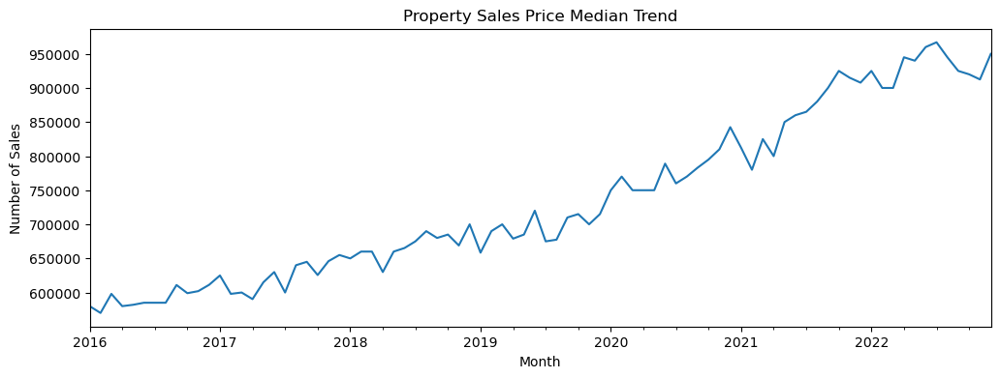

In [8]:
# Convert 'sale_date' to datetime if it's not already in datetime format
propertySalesPoint['sale_date'] = pd.to_datetime(propertySalesPoint['sale_date'])

# Plotting
median_seasonal_sales = propertySalesPoint.groupby(propertySalesPoint['sale_date'].dt.to_period("M"))['sale_price'].median()
median_seasonal_sales.plot(figsize=(12, 4), title='Property Sales Price Median Trend')

plt.xlabel('Month')
plt.ylabel('Number of Sales')
plt.show()

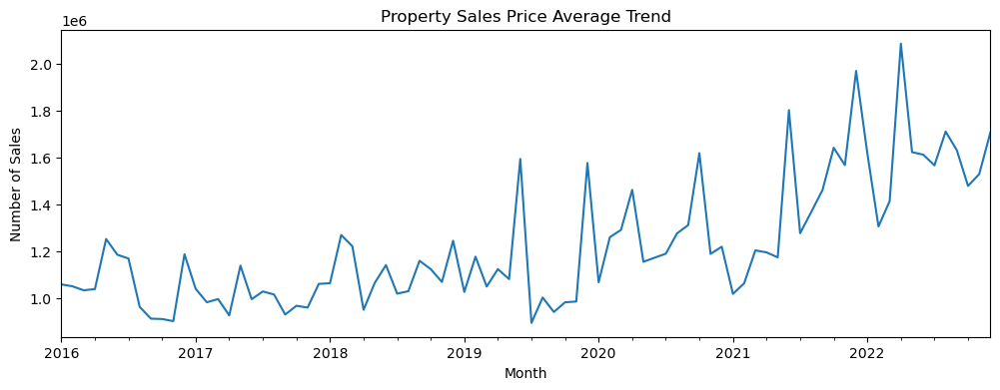

In [9]:
# Plotting
avg_seasonal_sales = propertySalesPoint.groupby(propertySalesPoint['sale_date'].dt.to_period("M"))['sale_price'].mean()
avg_seasonal_sales.plot(figsize=(12, 4), title='Property Sales Price Average Trend')

plt.xlabel('Month')
plt.ylabel('Number of Sales')
plt.show()

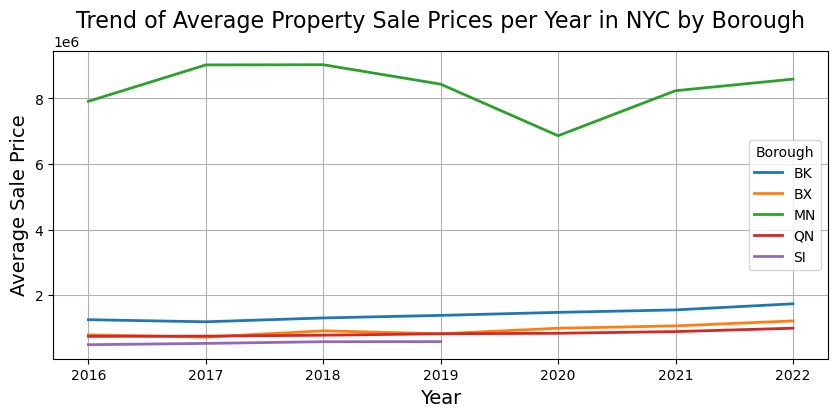

In [10]:
# Convert the 'sale_date' column to datetime and 'sale_price' to a proper numeric type
propertySalesPoint['sale_date'] = pd.to_datetime(propertySalesPoint['sale_date'])
propertySalesPoint['sale_price'] = pd.to_numeric(propertySalesPoint['sale_price'], errors='coerce')

# Extract year from 'sale_date' for trend analysis
propertySalesPoint['year'] = propertySalesPoint['sale_date'].dt.year

# Group by borough and year to get average sale price per year
average_prices = propertySalesPoint.groupby(['borough_name', 'year'])['sale_price'].mean().reset_index()

# Pivot the DataFrame to have years as the index and boroughs as the columns
pivot_prices = average_prices.pivot(index='year', columns='borough_name', values='sale_price')

# Plot the data
plt.figure(figsize=(10, 4))
for column in pivot_prices.columns:
    plt.plot(pivot_prices.index, pivot_prices[column], marker='', linewidth=2, label=column)

plt.title('Trend of Average Property Sale Prices per Year in NYC by Borough', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Average Sale Price', fontsize=14)
plt.legend(title='Borough')
plt.grid(True)
plt.show()

<span style="color:blue">

KEY FINDINGS

- Steady Growth in Property Values: The median and average sales price of properties has seen a upward trend from 2016 through 2022, indicating a consistent increase in the value of the median segment of the market. This growth trajectory suggests a healthy market expansion with a strong demand for properties.
- Manhattan Leads Diverse Borough Pricing: Manhattan maintaining a considerably higher average sale price compared to other boroughs, reiterating its position as a premium real estate market. The other boroughs (BK, BX, QN, SI) show more stable and closely grouped price trends, indicating similar market behaviors and potential for those seeking more stable investment options. 
    
</span>

**What are the trends in the `volume of property` sales over the years, and are there any seasonal patterns?**

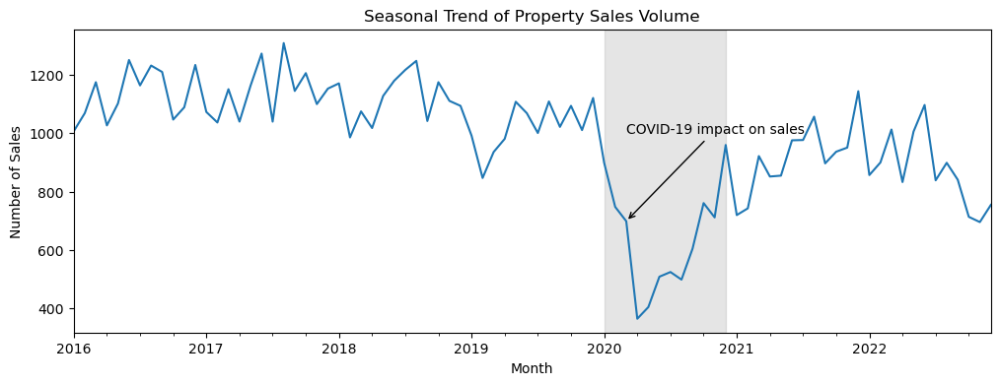

In [11]:
# Plotting
seasonal_sales = propertySalesPoint.groupby(propertySalesPoint['sale_date'].dt.to_period("M")).size()
seasonal_sales.plot(figsize=(12, 4), title='Seasonal Trend of Property Sales Volume')

# Annotate the COVID-19 impact on 2020 sales
covid_start_date = pd.to_datetime('2020-03-01')
plt.annotate('COVID-19 impact on sales', 
             xy=(covid_start_date, seasonal_sales.loc[covid_start_date.strftime('%Y-%m')]), 
             xytext=(covid_start_date, seasonal_sales.loc[covid_start_date.strftime('%Y-%m')] + 300),
             arrowprops=dict(facecolor='red', arrowstyle="->", connectionstyle="arc3"),
             ha='left')

plt.xlabel('Month')
plt.ylabel('Number of Sales')

# Highlight the year 2020
plt.axvspan(pd.to_datetime('2020-01-01'), pd.to_datetime('2020-12-31'), color='grey', alpha=0.2)

plt.show()


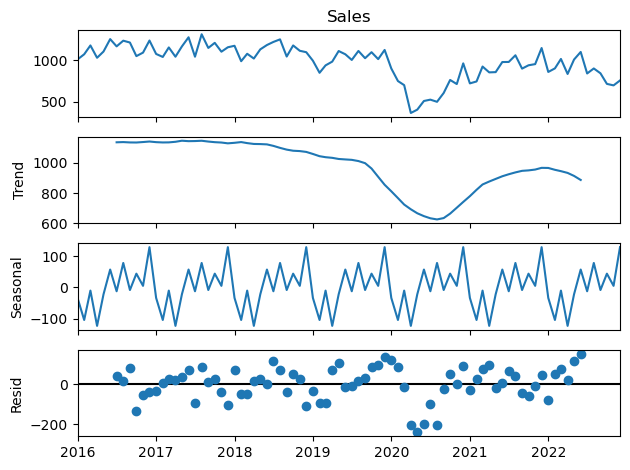

In [12]:
# Create decomposition plot
df_seasonal_sales = seasonal_sales.to_frame(name='Sales')
df_seasonal_sales.index = df_seasonal_sales.index.to_timestamp()
decomposition = seasonal_decompose(df_seasonal_sales['Sales'], model='additive')

fig = decomposition.plot()
plt.show()

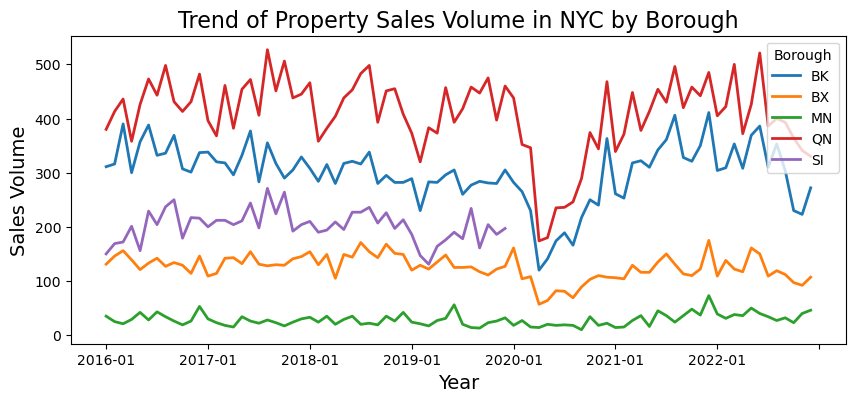

In [13]:
# Group by borough and year to get average sale price per year
propertySalesPoint["month"] = propertySalesPoint['sale_date'].dt.to_period("M")
sales_volume_borough = propertySalesPoint.groupby(['borough_name', 'month'])['address'].size().reset_index()

# Convert Period to string representation (e.g., '2020-01' for January 2020)
sales_volume_borough.index = sales_volume_borough.index.to_series().astype(str)

# Pivot the DataFrame to have years as the index and boroughs as the columns
pivot_sales_volume_borough = sales_volume_borough.pivot(index='month', columns='borough_name', values='address')
pivot_sales_volume_borough.index = pivot_sales_volume_borough.index.to_series().astype(str)

# Plot the data
plt.figure(figsize=(10, 4))
for column in pivot_sales_volume_borough.columns:
    plt.plot(pivot_sales_volume_borough.index, pivot_sales_volume_borough[column], marker='', linewidth=2, label=column)

plt.title('Trend of Property Sales Volume in NYC by Borough', fontsize=16)
plt.xlabel('Year', fontsize=14)
plt.ylabel('Sales Volume', fontsize=14)
plt.legend(title='Borough')
plt.gca().xaxis.set_major_locator(plt.MultipleLocator(12))

plt.show()

<span style="color:blue">
    
KEY FINDINGS
    
- Pandemic Disrupts Sales Volume Trend: The property sales volume were steady before they fell sharply in 2020 because of COVID-19. Post-pandemic recovery is observable, yet the market has not returned to pre-pandemic levels, indicating a lasting effect on the sales volume.
- Seasonality is exist: The sales volume highlights a declining long-term trend (due to COVID-19 with slow recovery). Seasonality is evident in sales, displaying regular patterns of peaks and troughs each year.
- Manhattan's Low Turnover Despite High Prices: Brooklyn and Queens leads among the borough and have big changes in sales over time. Manhattan, even though it's the most expensive, has the fewest sales, which may mean there aren't many houses being bought or sold there.
    
</span>

**Which boroughs have shown the most significant increase in property values, indicating potential for investment?**

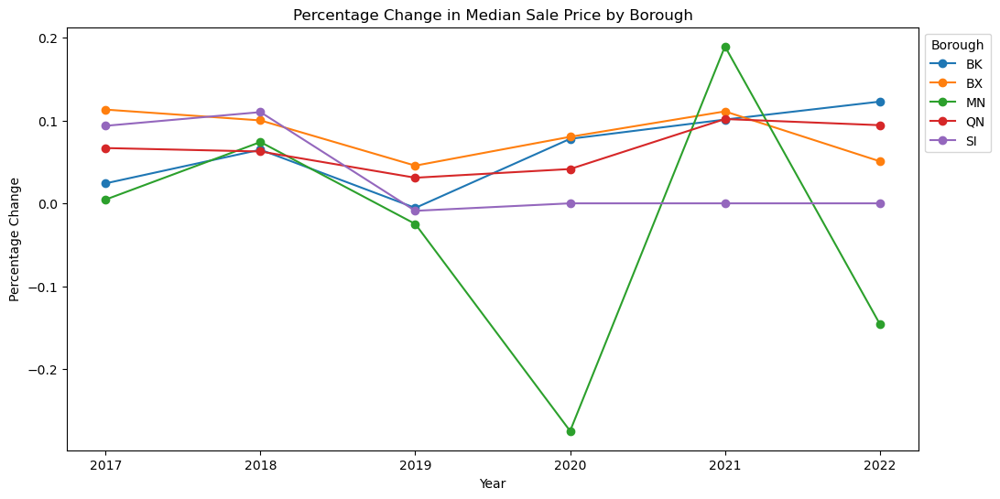

In [14]:
# Convert 'sale_date' to datetime if it's not already in datetime format
propertySalesPoint['sale_date'] = pd.to_datetime(propertySalesPoint['sale_date'])

# Group data by 'borough' and calculate the median sale price for each year
median_price_by_borough = propertySalesPoint.groupby(['borough_name', propertySalesPoint['sale_date'].dt.year])['sale_price'].median().unstack()

# Calculate the percentage change in median sale price from the first available year
percentage_change_by_borough = median_price_by_borough.T.pct_change()

# Plot the percentage change for all boroughs
percentage_change_by_borough.plot(figsize=(12, 6), marker='o')
plt.title('Percentage Change in Median Sale Price by Borough')
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.legend(title='Borough', loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

<span style="color:blue">
    
KEY FINDINGS
    
- Brooklyn and Queens Rise as Manhattan Dips in Median Sale Price Changes: Brooklyn (BK) and Queens (QN) display the most consistent upward trends over the years, marking them as boroughs with significant and stable growth in property values. In contrast, Manhattan (MN) shows a sharp decline in 2020, suggesting a potential devaluation during that period.
    
</span>

## 4.2 Geographical Analysis

**What are the high and low-value areas in terms of property `sale prices` and `prices per square feet` across different zip codes?**

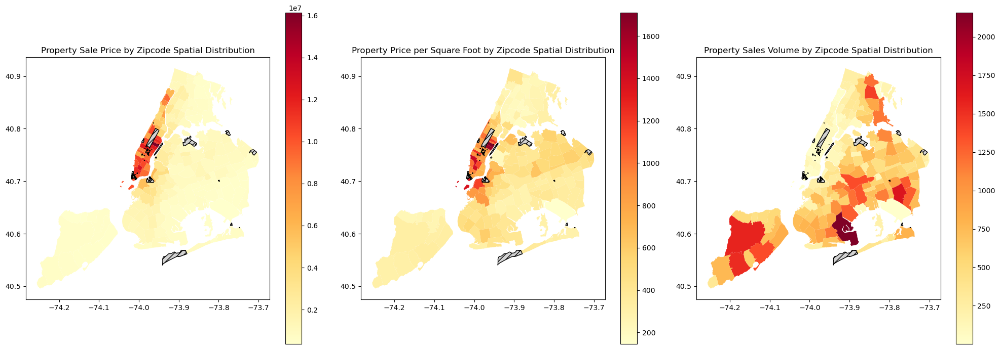

In [15]:
# Create figure with 2 subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 7))

# Plot the first spatial distribution of sale price
propertySalesZipcode.plot(column='sale_price', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[0], 
              missing_kwds={
                "color": "lightgrey",
                "edgecolor": "black",
                "hatch": "///",
                "label": "Missing values",
                })

axs[0].set_title('Property Sale Price by Zipcode Spatial Distribution')

# Plot the second spatial distribution of price per square foot
propertySalesZipcode.plot(column='price_sq_ft', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[1], 
              missing_kwds={
                "color": "lightgrey",
                "edgecolor": "black",
                "hatch": "///",
                "label": "Missing values",
                })

axs[1].set_title('Property Price per Square Foot by Zipcode Spatial Distribution')

# Plot the third spatial distribution of sales volume
propertySalesZipcode.plot(column='sales_volume', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[2], 
              missing_kwds={
                "color": "lightgrey",
                "edgecolor": "black",
                "hatch": "///",
                "label": "Missing values",
                })

axs[2].set_title('Property Sales Volume by Zipcode Spatial Distribution')

plt.tight_layout()
plt.show()

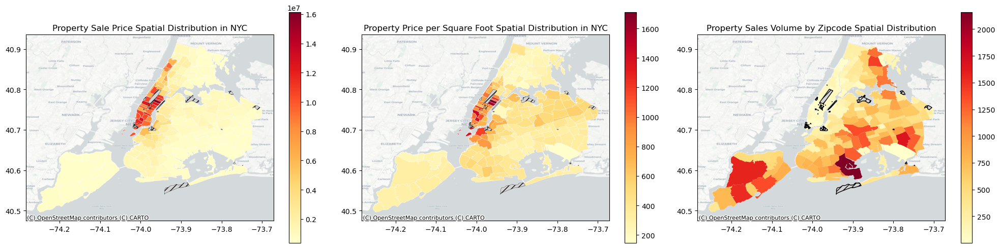

In [21]:
# Create figure with 2 subplots
fig, axs = plt.subplots(1, 3, figsize=(20, 5))

# Plot the first spatial distribution of sale price
propertySalesZipcode.plot(
    column='sale_price', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[0], edgecolor="white", linewidth=0.25,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "black",
        "hatch": "///",
        "label": "Missing values",
    })

axs[0].set_title('Property Sale Price Spatial Distribution in NYC')
cx.add_basemap(axs[0], source=cx.providers.CartoDB.Positron, crs=propertySalesZipcode.crs)

# Plot the second spatial distribution of price per square foot
propertySalesZipcode.plot(
    column='price_sq_ft', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[1], edgecolor="white", linewidth=0.25,
    missing_kwds={
        "color": "lightgrey",
        "edgecolor": "black",
        "hatch": "///",
        "label": "Missing values",
    })

axs[1].set_title('Property Price per Square Foot Spatial Distribution in NYC')
cx.add_basemap(axs[1], source=cx.providers.CartoDB.Positron, crs=propertySalesZipcode.crs)

# Plot the third spatial distribution of sales volume
propertySalesZipcode.plot(column='sales_volume', colormap='YlOrRd', legend=True, markersize=0.01, ax=axs[2], 
              missing_kwds={
                "color": "lightgrey",
                "edgecolor": "black",
                "hatch": "///",
                "label": "Missing values",
                })

axs[2].set_title('Property Sales Volume by Zipcode Spatial Distribution')
cx.add_basemap(axs[2], source=cx.providers.CartoDB.Positron, crs=propertySalesZipcode.crs)

plt.tight_layout()
plt.show()

In [17]:
# Create a folium map object
m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# Add the GeoDataFrame to the map
cp = folium.Choropleth(
    geo_data=zipcode,
    data=propertySalesZipcode,
    columns=['ZIPCODE', 'sale_price'],
    key_on='feature.properties.ZIPCODE',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Sale Price'
).add_to(m)

# Creating a state indexed version of the dataframe so we can lookup values
zipcode_copy = zipcode.copy()
zipcode_indexed = propertySalesZipcode.set_index('ZIPCODE')

# Looping through the geojson object and adding a new property (price_sq_ft)
# and assigning a value from our dataframe
for s in cp.geojson.data['features']:
    zipcode_copy = s['properties']['ZIPCODE']
    price_sq_ft = zipcode_indexed.loc[zipcode_copy, 'sale_price']
    
    # Check if the value is numeric before assigning it
    if isinstance(price_sq_ft, (int, float)):
        s['properties']['sale_price'] = float(price_sq_ft)

# Create a list of tooltip fields
tooltip_fields = ['ZIPCODE', 'COUNTY', 'sale_price']

# Adding a tooltip/hover to the choropleth's geojson
folium.GeoJsonTooltip(fields=tooltip_fields).add_to(cp.geojson)

# Change basemap and add map control
folium.TileLayer('cartodbpositron').add_to(m)
# folium.LayerControl().add_to(m)

# Display the map
m

In [18]:
# Create a folium map object
m = folium.Map(location=[40.7128, -74.0060], zoom_start=10)

# Add the GeoDataFrame to the map
mp = folium.Choropleth(
    geo_data=zipcode,
    data=propertySalesZipcode,
    columns=['ZIPCODE', 'price_sq_ft'],
    key_on='feature.properties.ZIPCODE',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Sale Price'
).add_to(m)

# Creating a state indexed version of the dataframe so we can lookup values
zipcode_copy = zipcode.copy()
zipcode_indexed = propertySalesZipcode.set_index('ZIPCODE')

# Looping through the geojson object and adding a new property (price_sq_ft)
# and assigning a value from our dataframe
for s in mp.geojson.data['features']:
    zipcode_copy = s['properties']['ZIPCODE']
    price_sq_ft = zipcode_indexed.loc[zipcode_copy, 'price_sq_ft']
    
    # Check if the value is numeric before assigning it
    if isinstance(price_sq_ft, (int, float)):
        s['properties']['price_sq_ft'] = float(price_sq_ft)

# Create a list of tooltip fields
tooltip_fields = ['ZIPCODE', 'COUNTY', 'price_sq_ft']

# Adding a tooltip/hover to the choropleth's geojson
folium.GeoJsonTooltip(fields=tooltip_fields).add_to(mp.geojson)

# Change basemap and add map control
folium.TileLayer('cartodbpositron').add_to(m)

# Display the map
m

<span style="color:blue">

KEY FINDINGS

   - Market Concentration: The dense clustering of high-value sales in Manhattan indicates a strong market concentration, suggesting that investors focus on this borough for premium property acquisitions.
   - Pricing Disparities: There's a big difference in how much properties cost, especially when you look at the cost for each square foot. This is important for people making decisions about where to build new homes or how to make housing more affordable.
   - Small Spaces, Big Value: Even smaller apartments in Manhattan are very pricey. This suggests that people might be willing to pay a lot for a prestigious address, making these properties a good choice for investors looking for a high return.
</span>

## 4.3 Comparative Market Analysis

**How do property prices compare between different building classes (e.g., one-family dwellings vs. two-family dwellings)?**

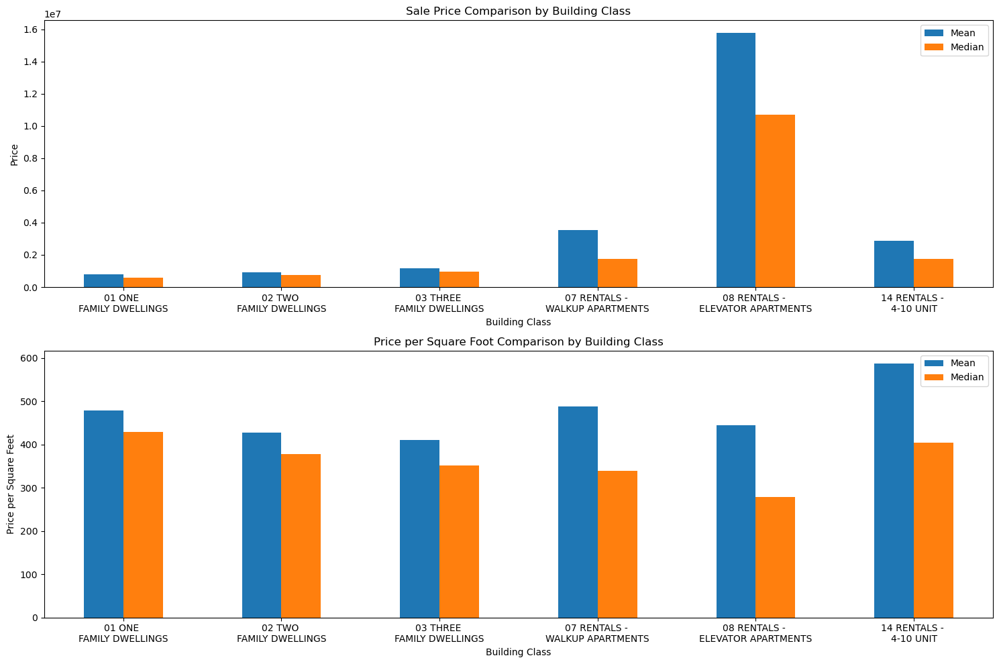

In [20]:
# Group data by building class and calculate summary statistics for sale price
building_class_comparison_sale_price = propertySalesPoint.groupby('building_class_category')['sale_price'].agg(['mean', 'median'])

# Group data by building class and calculate summary statistics for price per square foot
building_class_comparison_price_sq_ft = propertySalesPoint.groupby('building_class_category')['price_sq_ft'].agg(['mean', 'median'])

# Create subplots
fig, axs = plt.subplots(2, 1, figsize=(15, 10))

# Define x-axis labels with two lines
x_labels = [
    '01 ONE \nFAMILY DWELLINGS',
    '02 TWO \nFAMILY DWELLINGS', 
    '03 THREE \nFAMILY DWELLINGS',
    '07 RENTALS - \nWALKUP APARTMENTS',
    '08 RENTALS - \nELEVATOR APARTMENTS',
    '14 RENTALS - \n4-10 UNIT', 
]

x_ticks = np.arange(len(x_labels))

# Plot for sale price comparison
building_class_comparison_sale_price.plot(kind='bar', ax=axs[0])
axs[0].set_title('Sale Price Comparison by Building Class')
axs[0].set_xlabel('Building Class')
axs[0].set_ylabel('Price')
axs[0].legend(['Mean', 'Median'])
axs[0].set_xticks(x_ticks)
axs[0].set_xticklabels(x_labels, rotation=0) 

# Plot for price per square foot comparison
building_class_comparison_price_sq_ft.plot(kind='bar', ax=axs[1])
axs[1].set_title('Price per Square Foot Comparison by Building Class')
axs[1].set_xlabel('Building Class')
axs[1].set_ylabel('Price per Square Feet')
axs[1].legend(['Mean', 'Median'])
axs[1].set_xticks(x_ticks)
axs[1].set_xticklabels(x_labels, rotation=0)  

plt.tight_layout()
plt.show()


<span style="color:blue">

KEY FINDINGS:

- Sale Price Disparity by Building Class: There is a significant disparity in sale prices among different building classes, with '08 RENTALS - ELEVATOR APARTMENTS' showing the highest mean and median sale prices. This suggests a robust market demand or a premium on properties with elevators, which could be due to higher square footage or a preference for such amenities. one-family dwellings appear more affordable, showing lower sale prices and price per square foot, potentially appealing to a different set of buyers or investors.

- Elevator apartments' high prices reflect huge size: when we look at the price per square foot, the distinction is less pronounced, suggesting that while elevator apartments are overall more expensive, the cost relative to their size is more in line with other property types. This could indicate that the premium price of elevator apartments may be attributed to factors such as larger size, amenities, location, or desirability rather than just the space offered.
    
</span>    

# 5 Conclusion

**EXECUTIVE SUMMARY**

Trend Analysis:
- The New York City real estate market has experienced growth in property values from 2016 to 2022, with median and average sales prices on an upward trajectory.
- Manhattan leads the market with the highest property prices, yet faces low sales volume, suggesting exclusivity and limited availability.
- Brooklyn and Queens show significant and steady growth in property values, presenting themselves as promising areas for investment, especially given Manhattan's recent price dip in 2020.

Geographical Analysis:
- High-value sales are concentrated in Manhattan, indicating a market preference for luxury property investments.
- Price disparities across zip codes, particularly in price per square foot, highlight varying investment potentials and the need for targeted housing affordability strategies.
- Smaller properties in Manhattan command high values, reinforcing the borough's appeal to investors seeking premium returns despite the smaller space.

Comparative Market Analysis:
- There is a distinct difference in sale prices across building classes, with elevator apartments seeing the highest prices due to factors beyond mere square footage, such as size and amenities.
- Despite their high overall cost, elevator apartments align with other building classes in terms of price per square foot, suggesting a balanced premium when considering the size and features of the property.